In [1]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import matplotlib.ticker as mtick
import seaborn as sns
from pandasql import sqldf
import matplotlib.patheffects as path_effects
#from matplotlib.dates import DateFormatter
#from datetime import datetime
#from datetime import date

#set notebook to view all columns in cell
pd.set_option('display.max_rows', None)

In [2]:
#dss = pd.read_csv('ds_salaries.csv')
#dss = dss.drop('Unnamed: 0', axis=1)

In [3]:
dss = pd.read_csv('salaries.csv')
dss.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Data Engineer,253792,USD,253792,US,0,US,M
1,2023,SE,FT,Data Engineer,158620,USD,158620,US,0,US,M
2,2023,SE,FT,Business Intelligence Specialist,259900,USD,259900,US,0,US,M
3,2023,SE,FT,Business Intelligence Specialist,139200,USD,139200,US,0,US,M
4,2023,SE,FT,Machine Learning Infrastructure Engineer,96000,GBP,118118,GB,100,GB,M


In [4]:
#precleaning info on ds_salaries.csv. Get the pre row count
dss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8310 entries, 0 to 8309
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           8310 non-null   int64 
 1   experience_level    8310 non-null   object
 2   employment_type     8310 non-null   object
 3   job_title           8310 non-null   object
 4   salary              8310 non-null   int64 
 5   salary_currency     8310 non-null   object
 6   salary_in_usd       8310 non-null   int64 
 7   employee_residence  8310 non-null   object
 8   remote_ratio        8310 non-null   int64 
 9   company_location    8310 non-null   object
 10  company_size        8310 non-null   object
dtypes: int64(4), object(7)
memory usage: 714.3+ KB


In [5]:
#rows
#print(dss.count())

In [6]:
#columns
print('columns:', len(dss.columns))

columns: 11


In [7]:
#import xlsx Series Report
#sr = pd.read_excel('SeriesReport-20231022151443_7d129b.xlsx', index_col=0, header=['Year','Jan','Feb','Mar','Apr',
 #                                                                                'May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])

sr = pd.read_excel('SeriesReport-20231022151443_7d129b.xlsx', sheet_name='Table1')
sr

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,HALF1,HALF2
0,2013,231.679,232.937,232.282,231.797,231.893,232.445,232.900,233.456,233.544,233.669,234.100,234.719,NaN,NaN
1,2014,235.288,235.547,236.028,236.468,236.918,237.231,237.498,237.460,237.477,237.430,236.983,236.252,NaN,NaN
2,2015,234.747,235.342,235.976,236.222,237.001,237.657,238.034,238.033,237.498,237.733,238.017,237.761,NaN,NaN
3,2016,237.652,237.336,238.080,238.992,239.557,240.222,240.101,240.545,241.176,241.741,242.026,242.637,NaN,NaN
4,2017,243.618,244.006,243.892,244.193,244.004,244.163,244.243,245.183,246.435,246.626,247.284,247.805,NaN,NaN
5,2018,248.859,249.529,249.577,250.227,250.792,251.018,251.214,251.663,252.182,252.772,252.594,252.767,NaN,NaN
6,2019,252.718,253.322,254.202,255.211,255.290,255.159,255.685,256.059,256.511,257.244,257.803,258.616,NaN,NaN
7,2020,259.037,259.248,258.124,256.092,255.868,256.986,258.278,259.411,260.029,260.286,260.813,262.035,NaN,NaN
8,2021,262.650,263.638,264.914,266.670,268.444,270.559,271.764,272.870,274.028,276.522,278.711,280.887,NaN,NaN
9,2022,282.599,284.610,287.472,288.611,291.268,294.728,294.628,295.320,296.539,297.987,298.598,298.990,NaN,NaN


In [8]:
#Drop Half1 and Half2 and make copy
sr2 =sr.drop(['HALF1','HALF2'], axis=1)
sr2

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
0,2013,231.679,232.937,232.282,231.797,231.893,232.445,232.900,233.456,233.544,233.669,234.100,234.719
1,2014,235.288,235.547,236.028,236.468,236.918,237.231,237.498,237.460,237.477,237.430,236.983,236.252
2,2015,234.747,235.342,235.976,236.222,237.001,237.657,238.034,238.033,237.498,237.733,238.017,237.761
3,2016,237.652,237.336,238.080,238.992,239.557,240.222,240.101,240.545,241.176,241.741,242.026,242.637
4,2017,243.618,244.006,243.892,244.193,244.004,244.163,244.243,245.183,246.435,246.626,247.284,247.805
5,2018,248.859,249.529,249.577,250.227,250.792,251.018,251.214,251.663,252.182,252.772,252.594,252.767
6,2019,252.718,253.322,254.202,255.211,255.290,255.159,255.685,256.059,256.511,257.244,257.803,258.616
7,2020,259.037,259.248,258.124,256.092,255.868,256.986,258.278,259.411,260.029,260.286,260.813,262.035
8,2021,262.650,263.638,264.914,266.670,268.444,270.559,271.764,272.870,274.028,276.522,278.711,280.887
9,2022,282.599,284.610,287.472,288.611,291.268,294.728,294.628,295.320,296.539,297.987,298.598,298.990


In [9]:
#Clean up dss

#Count Nulls
print(dss.isna().sum())

work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
dtype: int64


In [10]:
# Count Duplicates
print(dss.duplicated().sum())

3464


In [11]:
# Drop Duplicate
dss2 = dss.drop_duplicates()
dss2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4846 entries, 0 to 8309
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           4846 non-null   int64 
 1   experience_level    4846 non-null   object
 2   employment_type     4846 non-null   object
 3   job_title           4846 non-null   object
 4   salary              4846 non-null   int64 
 5   salary_currency     4846 non-null   object
 6   salary_in_usd       4846 non-null   int64 
 7   employee_residence  4846 non-null   object
 8   remote_ratio        4846 non-null   int64 
 9   company_location    4846 non-null   object
 10  company_size        4846 non-null   object
dtypes: int64(4), object(7)
memory usage: 454.3+ KB


In [12]:
dss2['company_location'].unique()
dss2['company_location'].value_counts()

US    3823
GB     334
CA     159
DE      71
ES      56
IN      51
FR      48
AU      22
PT      21
NL      18
BR      17
CO      14
IT      13
MX      11
GR      11
EE       9
JP       8
PL       8
NG       8
RU       7
IE       7
SI       6
CH       6
AT       6
UA       6
LV       6
SG       5
AR       5
DK       5
TR       5
PR       4
BE       4
FI       3
HR       3
IL       3
TH       3
SE       3
GH       3
AE       3
RO       3
CZ       3
ID       2
LU       2
HU       2
LT       2
PK       2
AS       2
KR       2
PH       2
KE       2
NO       2
SA       2
CF       2
QA       1
MD       1
CL       1
NZ       1
CN       1
IQ       1
DZ       1
HN       1
MY       1
MU       1
EG       1
AD       1
EC       1
GI       1
BS       1
IR       1
ZA       1
HK       1
BA       1
AM       1
MT       1
Name: company_location, dtype: int64

In [13]:
#Location (looking at Companies in US only)
#us_dss = dss2.loc[dss2['company_location']=='US'].reset_index(drop=True)
#us_dss.head(100)

In [14]:
#Location (looking at Companies in US and 14 next highest count countries)
dss3 = dss2.loc[dss2['company_location'].isin(['US','GB','CA','ES','DE','IN','FR','AU','PT','NL','BR','CO','IT','MX','GR'])].reset_index(drop=True)
dss3.head(50)
dss3['company_location'].value_counts()

US    3823
GB     334
CA     159
DE      71
ES      56
IN      51
FR      48
AU      22
PT      21
NL      18
BR      17
CO      14
IT      13
GR      11
MX      11
Name: company_location, dtype: int64

In [15]:
#drop company_location column as unneeded and currently redundant
#us_dss = us_dss.drop('company_location', axis=1)
#us_dss.head()

In [16]:
#Count current dss3 rows and info
dss3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4669 entries, 0 to 4668
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           4669 non-null   int64 
 1   experience_level    4669 non-null   object
 2   employment_type     4669 non-null   object
 3   job_title           4669 non-null   object
 4   salary              4669 non-null   int64 
 5   salary_currency     4669 non-null   object
 6   salary_in_usd       4669 non-null   int64 
 7   employee_residence  4669 non-null   object
 8   remote_ratio        4669 non-null   int64 
 9   company_location    4669 non-null   object
 10  company_size        4669 non-null   object
dtypes: int64(4), object(7)
memory usage: 401.4+ KB


In [17]:
#create precent change function
#def percentage_change(col1,col2):
#    return round(
#        ((col2 - col1) / col1) * 100, 
#        2)
#sr2['Annual_Inflation_Rate']= sr2.apply(percentage_change, axis=0)

In [18]:
#Calculate average annual inflation rate from  Series Report  [(December CPI - Last December CPI)/December CPI]
sr2['Annual_Inflation_Rate'] = sr2['Dec'].pct_change()
#sr2.at[10, 'Annual_Inflation_Rate'] = (sr2.at[10, 'Sep'] - sr2.at[9, 'Dec'])/sr2.at[10, 'Sep']
sr2

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Annual_Inflation_Rate
0,2013,231.679,232.937,232.282,231.797,231.893,232.445,232.900,233.456,233.544,233.669,234.100,234.719,NaN
1,2014,235.288,235.547,236.028,236.468,236.918,237.231,237.498,237.460,237.477,237.430,236.983,236.252,0.006531
2,2015,234.747,235.342,235.976,236.222,237.001,237.657,238.034,238.033,237.498,237.733,238.017,237.761,0.006387
3,2016,237.652,237.336,238.080,238.992,239.557,240.222,240.101,240.545,241.176,241.741,242.026,242.637,0.020508
4,2017,243.618,244.006,243.892,244.193,244.004,244.163,244.243,245.183,246.435,246.626,247.284,247.805,0.021299
5,2018,248.859,249.529,249.577,250.227,250.792,251.018,251.214,251.663,252.182,252.772,252.594,252.767,0.020024
6,2019,252.718,253.322,254.202,255.211,255.290,255.159,255.685,256.059,256.511,257.244,257.803,258.616,0.023140
7,2020,259.037,259.248,258.124,256.092,255.868,256.986,258.278,259.411,260.029,260.286,260.813,262.035,0.013220
8,2021,262.650,263.638,264.914,266.670,268.444,270.559,271.764,272.870,274.028,276.522,278.711,280.887,0.071945
9,2022,282.599,284.610,287.472,288.611,291.268,294.728,294.628,295.320,296.539,297.987,298.598,298.990,0.064449


In [19]:
#function to find the sum in Annual_Inflation_Rate between years
def inflation_dif_sum(year1, year2):
    isum = 0
    for i in range(year1, year2):
        isum += sr2.loc[sr2['Year']==i, 'Annual_Inflation_Rate'].squeeze()
       # print(isum)
    return isum

In [20]:
# Test inflation_dif_sum
print(inflation_dif_sum(2020,2020))
print(inflation_dif_sum(2020,2021))
print(inflation_dif_sum(2020,2022))
print(inflation_dif_sum(2020,2023))
print(inflation_dif_sum(2023,2020)) # break if bigger date is first
#sr2.loc[sr2['Year']==2020, 'Annual_Inflation_Rate'].squeeze()

0
0.013220373062765134
0.0851649606178626
0.14961436553870278
0


   year  $1 Dollar worth compared to 2020
0  2020                          1.000000
1  2021                          0.986780
2  2022                          0.914835
3  2023                          0.850386


C:\Users\Stephen Lucas\AppData\Local\Temp\ipykernel_20112\3792269371.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels)


[Text(0, 0.84, '$0.84'),
 Text(0, 0.86, '$0.86'),
 Text(0, 0.88, '$0.88'),
 Text(0, 0.8999999999999999, '$0.9'),
 Text(0, 0.9199999999999999, '$0.92'),
 Text(0, 0.94, '$0.94'),
 Text(0, 0.96, '$0.96'),
 Text(0, 0.98, '$0.98'),
 Text(0, 1.0, '$1.0'),
 Text(0, 1.02, '$1.02')]

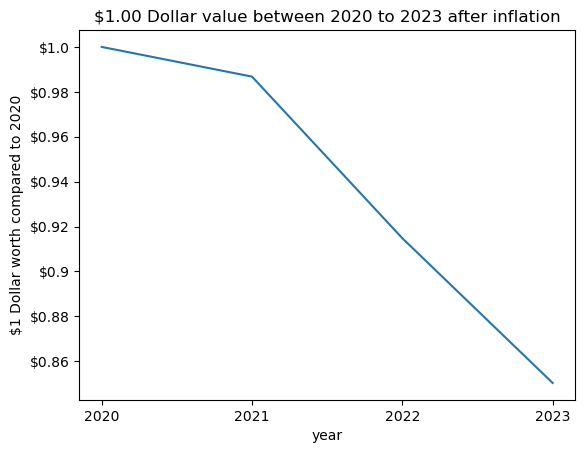

In [21]:
#Dollar Depretiation between 2020 to 2023 with the $1.00

dollarDepretiationDF = pd.DataFrame(
    list(zip(['2020','2021','2022','2023'],
             [inflation_dif_sum(2020,2020), inflation_dif_sum(2020,2021), inflation_dif_sum(2020,2022), inflation_dif_sum(2020,2023)])) , 
         columns =['year', '$1 Dollar worth compared to 2020'])
#convert '$1 Dollar worth compared to 2020' to dollar
dollarDepretiationDF['$1 Dollar worth compared to 2020']= dollarDepretiationDF['$1 Dollar worth compared to 2020'].apply(lambda x: 1 - x)
print(dollarDepretiationDF)
plt.title('$1.00 Dollar value between 2020 to 2023 after inflation')
ax = sns.lineplot(data=dollarDepretiationDF, x='year', y='$1 Dollar worth compared to 2020')
# getting the array of values of y-axis
ticks = ax.get_yticks()
# formatted the values into strings beginning with dollar sign
new_labels = [f'${round(float(amt),2)}' for amt in ticks]
# Set the new labels
ax.set_yticklabels(new_labels)

In [22]:
#get inflation_Dif sum between posted year and 2020
#inflation_Dif_2020 = us_dss['work_year'].apply(lambda x: inflation_dif_sum(2020,x))
inflation_Dif_2020 = dss3['work_year'].apply(lambda x: inflation_dif_sum(2020,x))
inflation_Dif_2020

0       0.149614
1       0.149614
2       0.149614
3       0.149614
4       0.149614
5       0.149614
6       0.149614
7       0.149614
8       0.149614
9       0.149614
10      0.149614
11      0.149614
12      0.149614
13      0.149614
14      0.149614
15      0.149614
16      0.149614
17      0.149614
18      0.149614
19      0.149614
20      0.149614
21      0.149614
22      0.149614
23      0.149614
24      0.149614
25      0.149614
26      0.149614
27      0.149614
28      0.149614
29      0.149614
30      0.149614
31      0.149614
32      0.149614
33      0.149614
34      0.149614
35      0.149614
36      0.149614
37      0.149614
38      0.149614
39      0.149614
40      0.149614
41      0.149614
42      0.149614
43      0.149614
44      0.149614
45      0.149614
46      0.149614
47      0.149614
48      0.149614
49      0.149614
50      0.149614
51      0.149614
52      0.149614
53      0.149614
54      0.149614
55      0.149614
56      0.149614
57      0.149614
58      0.1496

In [23]:
dss3

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Data Engineer,253792,USD,253792,US,0,US,M
1,2023,SE,FT,Data Engineer,158620,USD,158620,US,0,US,M
2,2023,SE,FT,Business Intelligence Specialist,259900,USD,259900,US,0,US,M
3,2023,SE,FT,Business Intelligence Specialist,139200,USD,139200,US,0,US,M
4,2023,SE,FT,Machine Learning Infrastructure Engineer,96000,GBP,118118,GB,100,GB,M
5,2023,SE,FT,Machine Learning Infrastructure Engineer,65000,GBP,79976,GB,100,GB,M
6,2023,SE,FT,Research Scientist,293000,USD,293000,US,0,US,M
7,2023,SE,FT,Research Scientist,185000,USD,185000,US,0,US,M
8,2023,SE,FT,Data Engineer,180000,USD,180000,US,0,US,M
9,2023,SE,FT,Data Engineer,90000,USD,90000,US,0,US,M


In [24]:
#add what the salary would be worth in 2020 to table (and convert to int)
#us_dss['salary_value_in_2020'] = (us_dss['salary_in_usd'] + (us_dss['salary_in_usd'] * inflation_Dif_2020)).astype(int)
#us_dss
dss3['salary_value_in_2020'] = round((dss3['salary_in_usd'] - (dss3['salary_in_usd'] * inflation_Dif_2020)),2)
dss3.head(50)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_value_in_2020
0,2023,SE,FT,Data Engineer,253792,USD,253792,US,0,US,M,215821.07
1,2023,SE,FT,Data Engineer,158620,USD,158620,US,0,US,M,134888.17
2,2023,SE,FT,Business Intelligence Specialist,259900,USD,259900,US,0,US,M,221015.23
3,2023,SE,FT,Business Intelligence Specialist,139200,USD,139200,US,0,US,M,118373.68
4,2023,SE,FT,Machine Learning Infrastructure Engineer,96000,GBP,118118,GB,100,GB,M,100445.85
5,2023,SE,FT,Machine Learning Infrastructure Engineer,65000,GBP,79976,GB,100,GB,M,68010.44
6,2023,SE,FT,Research Scientist,293000,USD,293000,US,0,US,M,249162.99
7,2023,SE,FT,Research Scientist,185000,USD,185000,US,0,US,M,157321.34
8,2023,SE,FT,Data Engineer,180000,USD,180000,US,0,US,M,153069.41
9,2023,SE,FT,Data Engineer,90000,USD,90000,US,0,US,M,76534.71


In [25]:
dss3['salary_value_in_2020'].describe()

count      4669.000000
mean     128188.968788
std       57374.083053
min       13443.750000
25%       88440.110000
50%      122625.610000
75%      163274.040000
max      450000.000000
Name: salary_value_in_2020, dtype: float64

In [26]:
print(dss3.isna().sum())

work_year               0
experience_level        0
employment_type         0
job_title               0
salary                  0
salary_currency         0
salary_in_usd           0
employee_residence      0
remote_ratio            0
company_location        0
company_size            0
salary_value_in_2020    0
dtype: int64


In [27]:
dss3.loc[dss3['salary_value_in_2020'] <=60]

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_value_in_2020


In [28]:
#convert work_year into a new str column
#us_dss['work_year2'] = us_dss['work_year'].astype(str)
#us_dss.info()
dss3['work_year2'] = dss3['work_year'].astype(str)
#dss2['work_year2'] = pd.to_datetime(dss2.work_year, format = '%Y')
#dss2['work_year3'] = pd.Series(dss2['work_year2']).dt.year
dss3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4669 entries, 0 to 4668
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   work_year             4669 non-null   int64  
 1   experience_level      4669 non-null   object 
 2   employment_type       4669 non-null   object 
 3   job_title             4669 non-null   object 
 4   salary                4669 non-null   int64  
 5   salary_currency       4669 non-null   object 
 6   salary_in_usd         4669 non-null   int64  
 7   employee_residence    4669 non-null   object 
 8   remote_ratio          4669 non-null   int64  
 9   company_location      4669 non-null   object 
 10  company_size          4669 non-null   object 
 11  salary_value_in_2020  4669 non-null   float64
 12  work_year2            4669 non-null   object 
dtypes: float64(1), int64(4), object(8)
memory usage: 474.3+ KB


In [29]:
dss3.loc[dss3['remote_ratio'] ==0]

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_value_in_2020,work_year2
0,2023,SE,FT,Data Engineer,253792,USD,253792,US,0,US,M,215821.07,2023
1,2023,SE,FT,Data Engineer,158620,USD,158620,US,0,US,M,134888.17,2023
2,2023,SE,FT,Business Intelligence Specialist,259900,USD,259900,US,0,US,M,221015.23,2023
3,2023,SE,FT,Business Intelligence Specialist,139200,USD,139200,US,0,US,M,118373.68,2023
6,2023,SE,FT,Research Scientist,293000,USD,293000,US,0,US,M,249162.99,2023
7,2023,SE,FT,Research Scientist,185000,USD,185000,US,0,US,M,157321.34,2023
8,2023,SE,FT,Data Engineer,180000,USD,180000,US,0,US,M,153069.41,2023
9,2023,SE,FT,Data Engineer,90000,USD,90000,US,0,US,M,76534.71,2023
10,2023,SE,FT,Data Scientist,165000,USD,165000,US,0,US,M,140313.63,2023
11,2023,SE,FT,Data Scientist,115500,USD,115500,US,0,US,M,98219.54,2023


In [30]:
#replace remote_ratio with: 100:Remote, 50:hybrid, 0:onsite
def remote_from_int_to_string(r):
    if (r==100):
        return 'Fully Remote (more than 80%)'
    elif (r==0):
        return 'No Remote (less than 20%)'
    else:
        return 'Hybrid'
dss4 = dss3.copy()
dss4['remote_ratio']=dss3['remote_ratio'].apply(lambda r: remote_from_int_to_string(r))
dss4.head(50)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_value_in_2020,work_year2
0,2023,SE,FT,Data Engineer,253792,USD,253792,US,No Remote (less than 20%),US,M,215821.07,2023
1,2023,SE,FT,Data Engineer,158620,USD,158620,US,No Remote (less than 20%),US,M,134888.17,2023
2,2023,SE,FT,Business Intelligence Specialist,259900,USD,259900,US,No Remote (less than 20%),US,M,221015.23,2023
3,2023,SE,FT,Business Intelligence Specialist,139200,USD,139200,US,No Remote (less than 20%),US,M,118373.68,2023
4,2023,SE,FT,Machine Learning Infrastructure Engineer,96000,GBP,118118,GB,Fully Remote (more than 80%),GB,M,100445.85,2023
5,2023,SE,FT,Machine Learning Infrastructure Engineer,65000,GBP,79976,GB,Fully Remote (more than 80%),GB,M,68010.44,2023
6,2023,SE,FT,Research Scientist,293000,USD,293000,US,No Remote (less than 20%),US,M,249162.99,2023
7,2023,SE,FT,Research Scientist,185000,USD,185000,US,No Remote (less than 20%),US,M,157321.34,2023
8,2023,SE,FT,Data Engineer,180000,USD,180000,US,No Remote (less than 20%),US,M,153069.41,2023
9,2023,SE,FT,Data Engineer,90000,USD,90000,US,No Remote (less than 20%),US,M,76534.71,2023


In [31]:
dss4.loc[dss4['remote_ratio'] =='No Remote (less than 20%)']

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_value_in_2020,work_year2
0,2023,SE,FT,Data Engineer,253792,USD,253792,US,No Remote (less than 20%),US,M,215821.07,2023
1,2023,SE,FT,Data Engineer,158620,USD,158620,US,No Remote (less than 20%),US,M,134888.17,2023
2,2023,SE,FT,Business Intelligence Specialist,259900,USD,259900,US,No Remote (less than 20%),US,M,221015.23,2023
3,2023,SE,FT,Business Intelligence Specialist,139200,USD,139200,US,No Remote (less than 20%),US,M,118373.68,2023
6,2023,SE,FT,Research Scientist,293000,USD,293000,US,No Remote (less than 20%),US,M,249162.99,2023
7,2023,SE,FT,Research Scientist,185000,USD,185000,US,No Remote (less than 20%),US,M,157321.34,2023
8,2023,SE,FT,Data Engineer,180000,USD,180000,US,No Remote (less than 20%),US,M,153069.41,2023
9,2023,SE,FT,Data Engineer,90000,USD,90000,US,No Remote (less than 20%),US,M,76534.71,2023
10,2023,SE,FT,Data Scientist,165000,USD,165000,US,No Remote (less than 20%),US,M,140313.63,2023
11,2023,SE,FT,Data Scientist,115500,USD,115500,US,No Remote (less than 20%),US,M,98219.54,2023


In [32]:
#replace experience_level with: EN: Entry-level, MI: Mid-level, SE: Senior-level, EX: Executive-level
def experience_level_expand_Abbreviation(r):
    if (r=='EN'):
        return 'Entry'
    elif (r=='MI'):
        return 'Mid'
    elif (r=='SE'):
        return 'Senior'
    else:
        return 'Executive'

dss5 = dss4.copy()
dss5['experience_level']=dss4['experience_level'].apply(lambda r: experience_level_expand_Abbreviation(r))
dss5.head(10)

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_value_in_2020,work_year2
0,2023,Senior,FT,Data Engineer,253792,USD,253792,US,No Remote (less than 20%),US,M,215821.07,2023
1,2023,Senior,FT,Data Engineer,158620,USD,158620,US,No Remote (less than 20%),US,M,134888.17,2023
2,2023,Senior,FT,Business Intelligence Specialist,259900,USD,259900,US,No Remote (less than 20%),US,M,221015.23,2023
3,2023,Senior,FT,Business Intelligence Specialist,139200,USD,139200,US,No Remote (less than 20%),US,M,118373.68,2023
4,2023,Senior,FT,Machine Learning Infrastructure Engineer,96000,GBP,118118,GB,Fully Remote (more than 80%),GB,M,100445.85,2023
5,2023,Senior,FT,Machine Learning Infrastructure Engineer,65000,GBP,79976,GB,Fully Remote (more than 80%),GB,M,68010.44,2023
6,2023,Senior,FT,Research Scientist,293000,USD,293000,US,No Remote (less than 20%),US,M,249162.99,2023
7,2023,Senior,FT,Research Scientist,185000,USD,185000,US,No Remote (less than 20%),US,M,157321.34,2023
8,2023,Senior,FT,Data Engineer,180000,USD,180000,US,No Remote (less than 20%),US,M,153069.41,2023
9,2023,Senior,FT,Data Engineer,90000,USD,90000,US,No Remote (less than 20%),US,M,76534.71,2023


In [33]:
dss5['job_title'].unique()

array(['Data Engineer', 'Business Intelligence Specialist',
       'Machine Learning Infrastructure Engineer', 'Research Scientist',
       'Data Scientist', 'Research Analyst', 'Data Quality Engineer',
       'Applied Scientist', 'Data Analyst', 'Director of Data Science',
       'BI Developer', 'Business Intelligence Analyst', 'Data Specialist',
       'Machine Learning Engineer', 'ML Engineer', 'Data Lead',
       'Research Engineer', 'Data Quality Analyst',
       'Business Intelligence Engineer', 'AI Programmer',
       'Data Product Manager', 'Decision Scientist',
       'Data Science Consultant', 'Financial Data Analyst',
       'Data Architect', 'Data Science Engineer', 'Analytics Engineer',
       'Data Strategy Manager', 'Data Manager',
       'Machine Learning Scientist', 'Computer Vision Engineer',
       'Data Visualization Specialist', 'Data Science Manager',
       'BI Analyst', 'Insight Analyst', 'AI Engineer',
       'Data Integration Specialist', 'Data Science Practit

In [34]:
dss5['job_title'].value_counts().head(20)

Data Engineer                               988
Data Scientist                              888
Data Analyst                                657
Machine Learning Engineer                   441
Analytics Engineer                          182
Research Scientist                          137
Data Architect                              115
Research Engineer                            88
ML Engineer                                  85
Applied Scientist                            77
Data Science Manager                         72
Machine Learning Scientist                   55
Data Manager                                 49
Business Intelligence Engineer               39
Business Intelligence Analyst                36
Data Science Consultant                      35
Data Specialist                              30
Research Analyst                             27
Machine Learning Infrastructure Engineer     27
Data Analytics Manager                       27
Name: job_title, dtype: int64

In [35]:
#exprot to CSV
#us_dss.to_csv('us_dss.csv')
dss5.to_csv('dss5.csv')

In [36]:
# filter for: Business Intelligence Specialist	

In [37]:
#us_dss_entrylevel = us_dss[us_dss.experience_level=='EN']
#us_dss_entrylevel.head()

In [38]:
#entrylevel_salary_mean=us_dss_entrylevel.groupby('work_year')['salary'].mean()
#entrylevel_salary_mean = pd.DataFrame(us_dss_entrylevel.groupby('work_year')['salary'].mean().reset_index())
#print(entrylevel_salary_mean)
#us_dss_entrylevel_salary_mean = us_dss_entrylevel + entrylevel_salary_mean
#us_dss_entrylevel_salary_mean.head()
#us_dss_entrylevel_salary_mean=entrylevel_salary_mean.join(us_dss_entrylevel[['work_year','remote_ratio']].set_index('work_year'), on='work_year')
#us_dss_entrylevel_salary_mean.head()

In [39]:
#salary per year vs remote_ratio
#plt.figure(figsize=(15,5))
#sns.barplot(data=us_dss_entrylevel_salary_mean, x='work_year', y='salary', hue='remote_ratio')
#plt.ylabel('Salary Mean')
#plt.show()

In [40]:
#datetime.datetime.strptime(us_dss['work_year'], '%Y')
#pd.to_datetime(us_dss['work_year'], format='%Y')
#us_dss['work_year'].dt.to_period('Y')
#df2021['cdc_case_mon_yr'] = us_dss['cdc_case_earliest_dt'].dt.to_period('M'
#us_dss['work_year'] = datetime.datetime.strptime(us_dss['work_year'], '%Y')
#us_dss['work_year'].head

    work_year                  remote_ratio  salary_value_in_2020
0        2020  Fully Remote (more than 80%)                119423
1        2020                        Hybrid                 92560
2        2020     No Remote (less than 20%)                 87534
3        2021  Fully Remote (more than 80%)                114474
4        2021                        Hybrid                 84376
5        2021     No Remote (less than 20%)                110899
6        2022  Fully Remote (more than 80%)                125074
7        2022                        Hybrid                 81028
8        2022     No Remote (less than 20%)                124308
9        2023  Fully Remote (more than 80%)                125527
10       2023                        Hybrid                 73696
11       2023     No Remote (less than 20%)                136806


<Axes: title={'center': 'Average Salary by Remote Ratio'}, xlabel='work_year', ylabel='salary_value_in_2020'>

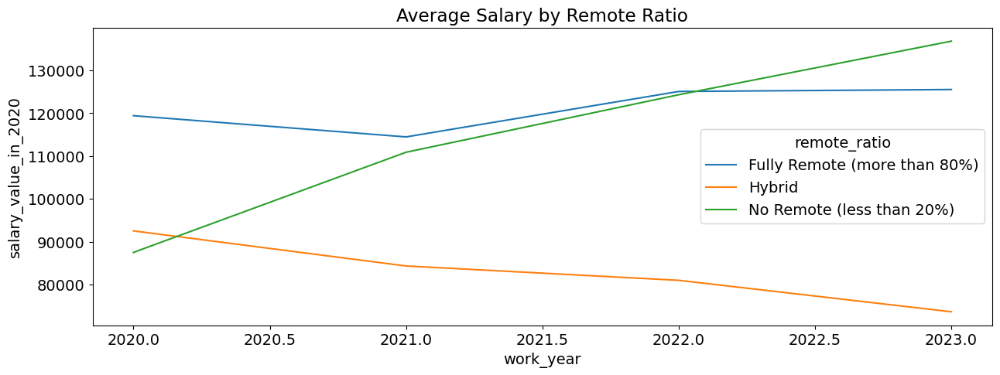

In [42]:
#salary_mean_by_rr = pd.DataFrame(us_dss.groupby(['work_year2','remote_ratio'])['salary_value_in_2020'].mean().astype(int).reset_index())
salary_mean_by_rr = pd.DataFrame(dss5.groupby(['work_year','remote_ratio'])['salary_value_in_2020'].mean().astype(int).reset_index())
print(salary_mean_by_rr)
plt.rcParams.update({'font.size': 14})
plt.figure(figsize=(15,5))
plt.title('Average Salary by Remote Ratio')
sns.lineplot(data=salary_mean_by_rr, x='work_year', y='salary_value_in_2020', hue='remote_ratio')
#plt.plot(salary_mean_by_rr['work_year'],salary_mean_by_rr['salary_value_in_2020'])

   work_year2                  remote_ratio  count
0        2020  Fully Remote (more than 80%)     34
1        2020                        Hybrid     16
2        2020     No Remote (less than 20%)     12
3        2021  Fully Remote (more than 80%)    100
4        2021                        Hybrid     55
5        2021     No Remote (less than 20%)     24
6        2022  Fully Remote (more than 80%)    590
7        2022                        Hybrid     52
8        2022     No Remote (less than 20%)    428
9        2023  Fully Remote (more than 80%)   1294
10       2023                        Hybrid     45
11       2023     No Remote (less than 20%)   2019


C:\Users\Stephen Lucas\AppData\Local\Temp\ipykernel_20112\271116888.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels)


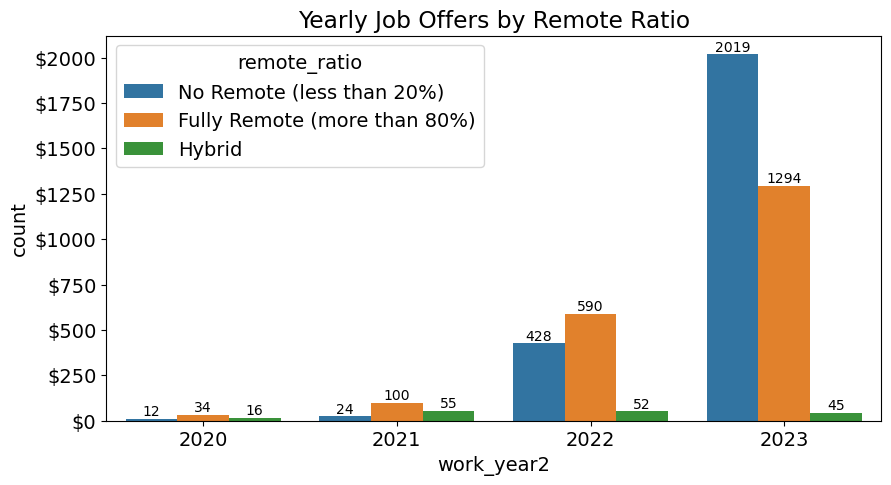

In [43]:
#print(pd.DataFrame(us_dss.groupby(['work_year2','remote_ratio']).size().reset_index(name='count')))
print(pd.DataFrame(dss5.groupby(['work_year2','remote_ratio']).size().reset_index(name='count')))
plt.figure(figsize=(10,5))
ax = sns.countplot(data=dss5, x='work_year2', hue='remote_ratio',order=['2020','2021','2022','2023'])
plt.title('Yearly Job Offers by Remote Ratio')
#ax.yaxis.set_major_formatter(tick) 
#plt.xticks(rotation=25)
#fmt = '${x:,.0f}'
#tick = mtick.StrMethodFormatter(fmt)
# getting the array of values of y-axis
ticks = ax.get_yticks()
# formatted the values into strings beginning with dollar sign
new_labels = [f'${int(amt)}' for amt in ticks]
# Set the new labels
ax.set_yticklabels(new_labels)
#ax.set(rc={'figure.figsize':(10,5)})
ax.bar_label(ax.containers[0], fontsize=10);
ax.bar_label(ax.containers[1], fontsize=10);
ax.bar_label(ax.containers[2], fontsize=10);
plt.show()

   work_year2 employment_type  count
0        2020              CT      2
1        2020              FL      1
2        2020              FT     57
3        2020              PT      2
4        2021              CT      3
5        2021              FL      1
6        2021              FT    173
7        2021              PT      2
8        2022              CT      3
9        2022              FL      3
10       2022              FT   1059
11       2022              PT      5
12       2023              CT      8
13       2023              FL      1
14       2023              FT   3348
15       2023              PT      1


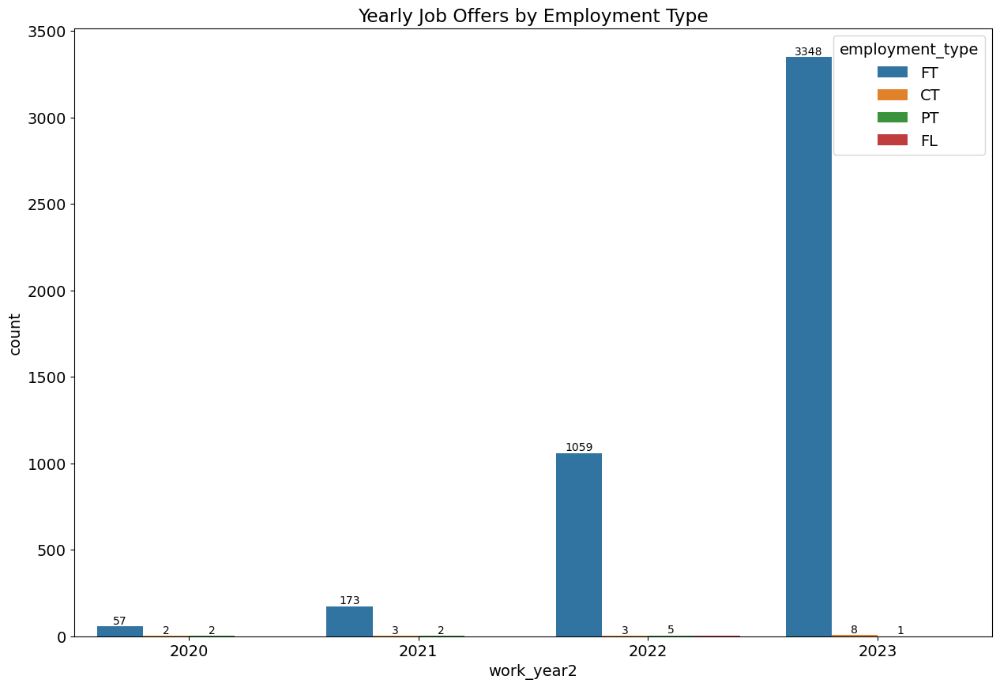

In [44]:
print(pd.DataFrame(dss5.groupby(['work_year2','employment_type']).size().reset_index(name='count')))
plt.figure(figsize=(15,10))
plt.title('Yearly Job Offers by Employment Type')
ax = sns.countplot(data=dss5, x='work_year2', hue='employment_type',order=['2020','2021','2022','2023'])
ax.bar_label(ax.containers[0], fontsize=10);
ax.bar_label(ax.containers[1], fontsize=10);
ax.bar_label(ax.containers[2], fontsize=10);

   work_year2 experience_level  count
0        2020            Entry     18
1        2020        Executive      4
2        2020              Mid     25
3        2020           Senior     15
4        2021            Entry     38
5        2021        Executive      7
6        2021              Mid     66
7        2021           Senior     68
8        2022            Entry     85
9        2022        Executive     38
10       2022              Mid    271
11       2022           Senior    676
12       2023            Entry    176
13       2023        Executive    149
14       2023              Mid    717
15       2023           Senior   2316


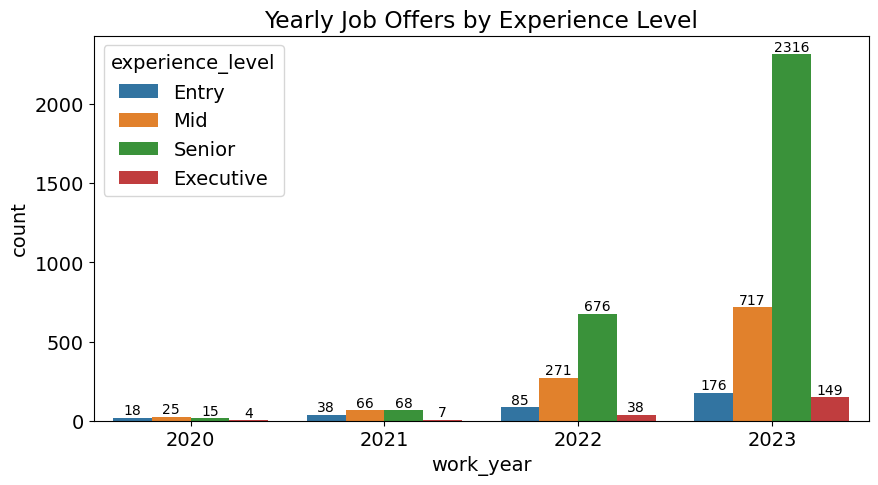

In [45]:
#experience_level_count_by_year = pd.DataFrame(us_dss.groupby(['work_year2','experience_level']).size().reset_index(name='count'))
experience_level_count_by_year = pd.DataFrame(dss5.groupby(['work_year2','experience_level']).size().reset_index(name='count'))
print(experience_level_count_by_year)
plt.figure(figsize=(10,5))
plt.title('Yearly Job Offers by Experience Level')
#sns.lineplot(data=experience_level_count_by_year, x='work_year2', y='count',hue='experience_level', hue_order=['Entry','Mid','Senior','Executive'])
ax = sns.countplot(data=dss5, x='work_year',hue='experience_level',hue_order=['Entry','Mid','Senior','Executive'])
ax.bar_label(ax.containers[0], fontsize=10);
ax.bar_label(ax.containers[1], fontsize=10);
ax.bar_label(ax.containers[2], fontsize=10);
ax.bar_label(ax.containers[3], fontsize=10);

[[<matplotlib.axis.YTick at 0x22e3bb28950>,

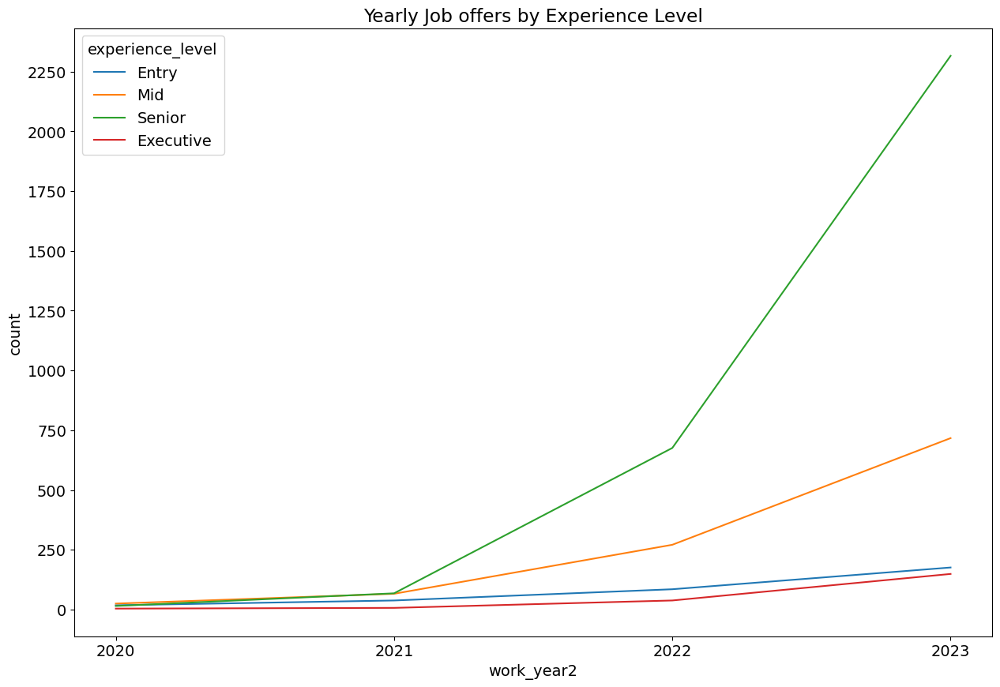

In [48]:
experience_level_count_by_year = pd.DataFrame(dss5.groupby(['work_year2','experience_level']).size().reset_index(name='count'))
plt.figure(figsize=(15,10))
plt.title('Yearly Job offers by Experience Level')
ax = sns.lineplot(data=experience_level_count_by_year, x='work_year2', y='count',hue='experience_level', hue_order=['Entry','Mid','Senior','Executive'])
ax.set(yticks=np.arange(0,2500,250))

   work_year2                  remote_ratio experience_level  count
0        2020  Fully Remote (more than 80%)           Senior      8
1        2020                        Hybrid           Senior      6
2        2020     No Remote (less than 20%)           Senior      1
3        2021  Fully Remote (more than 80%)           Senior     40
4        2021                        Hybrid           Senior     19
5        2021     No Remote (less than 20%)           Senior      9
6        2022  Fully Remote (more than 80%)           Senior    381
7        2022                        Hybrid           Senior      9
8        2022     No Remote (less than 20%)           Senior    286
9        2023  Fully Remote (more than 80%)           Senior    910
10       2023                        Hybrid           Senior     11
11       2023     No Remote (less than 20%)           Senior   1395


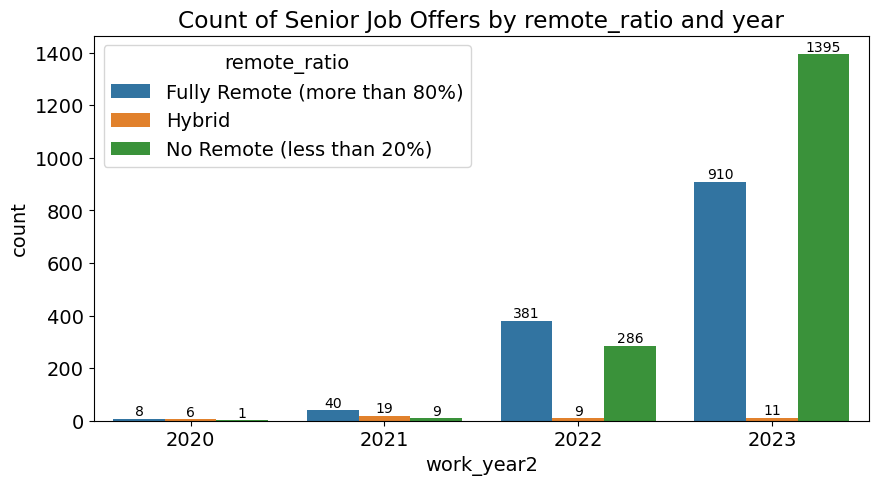

In [49]:
SE_jobs_count_by_year_and_rr = pd.DataFrame(dss5[dss5.experience_level=='Senior'].groupby(['work_year2','remote_ratio','experience_level']).size().reset_index(name='count'))
print(SE_jobs_count_by_year_and_rr)
plt.figure(figsize=(10,5))
plt.title('Count of Senior Job Offers by remote_ratio and year')
#sns.lineplot(data=SE_jobs_count_by_year_and_rr, x='work_year2', y='count',hue='remote_ratio')
ax = sns.barplot(data=SE_jobs_count_by_year_and_rr, x='work_year2', y='count',hue='remote_ratio')
ax.bar_label(ax.containers[0], fontsize=10);
ax.bar_label(ax.containers[1], fontsize=10);
ax.bar_label(ax.containers[2], fontsize=10);

In [50]:
SE_jobs_average_salary_by_year_and_rr = dss5[dss5.experience_level=='Senior'].groupby(['work_year2','remote_ratio'])['salary_value_in_2020'].median().astype(int).reset_index()
print('SE_jobs_average_salary_by_year_and_rr')
SE_jobs_average_salary_by_year_and_rr

SE_jobs_average_salary_by_year_and_rr


,work_year2,remote_ratio,salary_value_in_2020
0,2020,Fully Remote (more than 80%),168130
1,2020,Hybrid,118552
2,2020,No Remote (less than 20%),33511
3,2021,Fully Remote (more than 80%),148016
4,2021,Hybrid,93413
5,2021,No Remote (less than 20%),148016
6,2022,Fully Remote (more than 80%),137225
7,2022,Hybrid,87262
8,2022,No Remote (less than 20%),128991
9,2023,Fully Remote (more than 80%),132234


C:\Users\Stephen Lucas\AppData\Local\Temp\ipykernel_20112\3374938395.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels)


[Text(0, 40000.0, '$40000'),
 Text(0, 60000.0, '$60000'),
 Text(0, 80000.0, '$80000'),
 Text(0, 100000.0, '$100000'),
 Text(0, 120000.0, '$120000'),
 Text(0, 140000.0, '$140000'),
 Text(0, 160000.0, '$160000'),
 Text(0, 180000.0, '$180000'),
 Text(0, 200000.0, '$200000')]

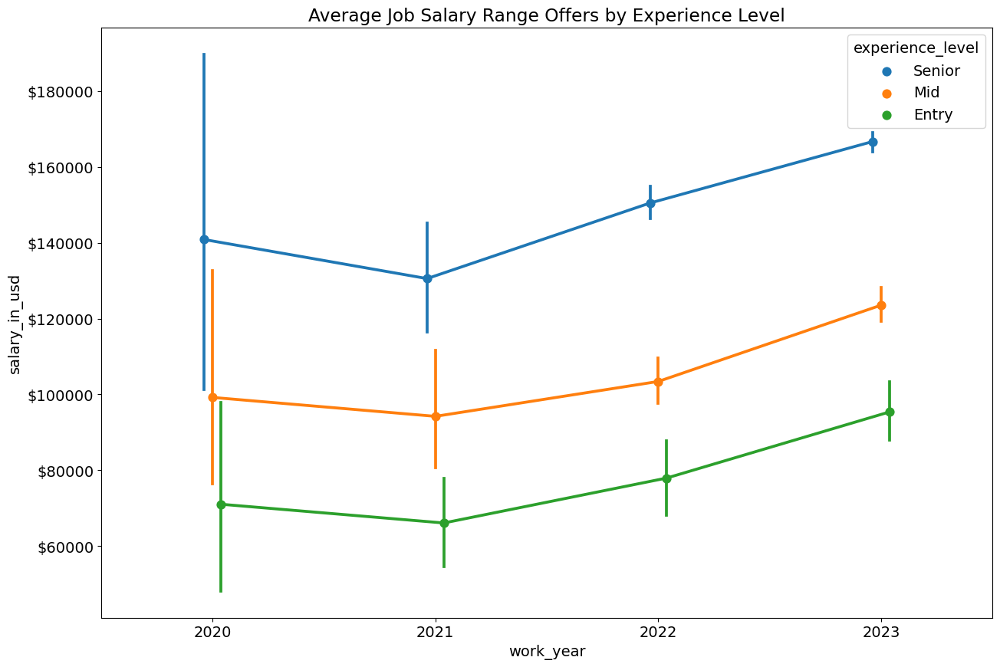

In [52]:
plt.figure(figsize=(15,10))
#plt.title('SE Job average salary offers by remote_ratio and year')
plt.title('Average Job Salary Range Offers by Experience Level')
dss5[dss5.experience_level.isin(['Senior', 'Mid','Entry'])]
#sns.lineplot(data=SE_jobs_average_salary_by_year_and_rr, x='work_year2', y='salary_value_in_2020',hue='remote_ratio')
#ax = sns.pointplot(data=dss5, x='work_year2', y='salary_value_in_2020',hue='remote_ratio',dodge=True)
#ax = sns.pointplot(data=dss5[dss5.experience_level.isin(['Senior', 'Mid','Entry'])], x='work_year', y='salary_value_in_2020',hue='experience_level',dodge=True)
ax = sns.pointplot(data=dss5[dss5.experience_level.isin(['Senior', 'Mid','Entry'])], x='work_year', y='salary_in_usd',hue='experience_level',dodge=True)
# getting the array of values of y-axis
ticks = ax.get_yticks()
# formatted the values into strings beginning with dollar sign
new_labels = [f'${int(amt)}' for amt in ticks]
# Set the new labels
ax.set_yticklabels(new_labels)

#ax.set(yticks=np.arange(40000,200000,25000))
#ax.label(ax.containers[1], fontsize=10);
#medians = SE_jobs_average_salary_by_year_and_rr['salary_value_in_2020']
#print(medians)
#vertical_offset = dss5['salary_value_in_2020'].median() * 0.05 # offset from median for display
#print(vertical_offset)
#add_median_labels(ax)
#for xtick in ax.get_xticks():
    #ax.text(xtick,SE_jobs_average_salary_by_year_and_rr[xtick] + vertical_offset,SE_jobs_average_salary_by_year_and_rr[xtick],
    #ax.text(xtick, medians[xtick] + vertical_offset, medians[xtick],
          #horizontalalignment='center',size='x-small',color='w',weight='semibold')

<Axes: xlabel='work_year', ylabel='salary_value_in_2020'>

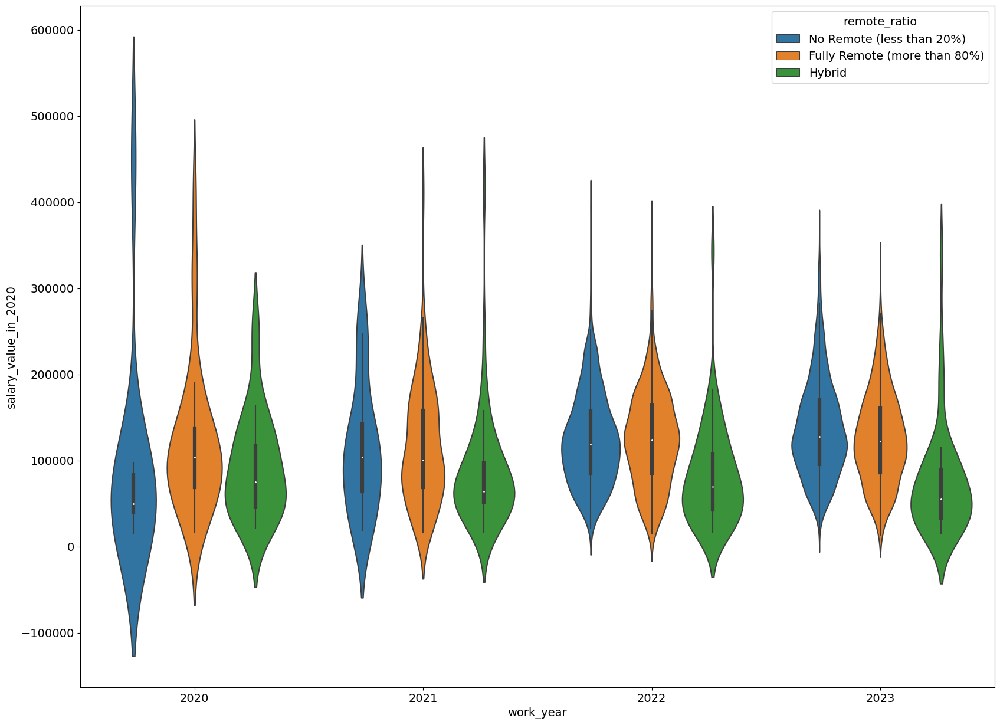

In [49]:
plt.figure(figsize=(20,15))
#sns.violinplot(data=us_dss, x='salary_value_in_2020',y='work_year2', hue='remote_ratio')
#sns.violinplot(data=dss3, y='salary_value_in_2020',x='work_year2', hue='remote_ratio',order=['2020','2021','2022','2023'])
sns.violinplot(data=dss5, y='salary_value_in_2020',x='work_year',hue='remote_ratio',spanmode = 'hard',native_scale=True)

In [54]:
def add_median_labels(ax, fmt='.0f'):
    lines = ax.get_lines()
    boxes = [c for c in ax.get_children() if type(c).__name__ == 'PathPatch']
    lines_per_box = int(len(lines) / len(boxes))
    for median in lines[4:len(lines):lines_per_box]:
        x, y = (data.mean() for data in median.get_data())
        # choose value depending on horizontal or vertical plot orientation
        #value = x if (median.get_xdata()[1] - median.get_xdata()[0]) == 0 else y
        value = y
        text = ax.text(x, y, f'${value:{fmt}}', ha='center', va='center',
                       fontweight='bold', color='white')
        # create median-colored border around white text for contrast
        text.set_path_effects([
            path_effects.Stroke(linewidth=3, foreground=median.get_color()),
            path_effects.Normal(),
        ])

C:\Users\Stephen Lucas\AppData\Local\Temp\ipykernel_20112\3435144990.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels)


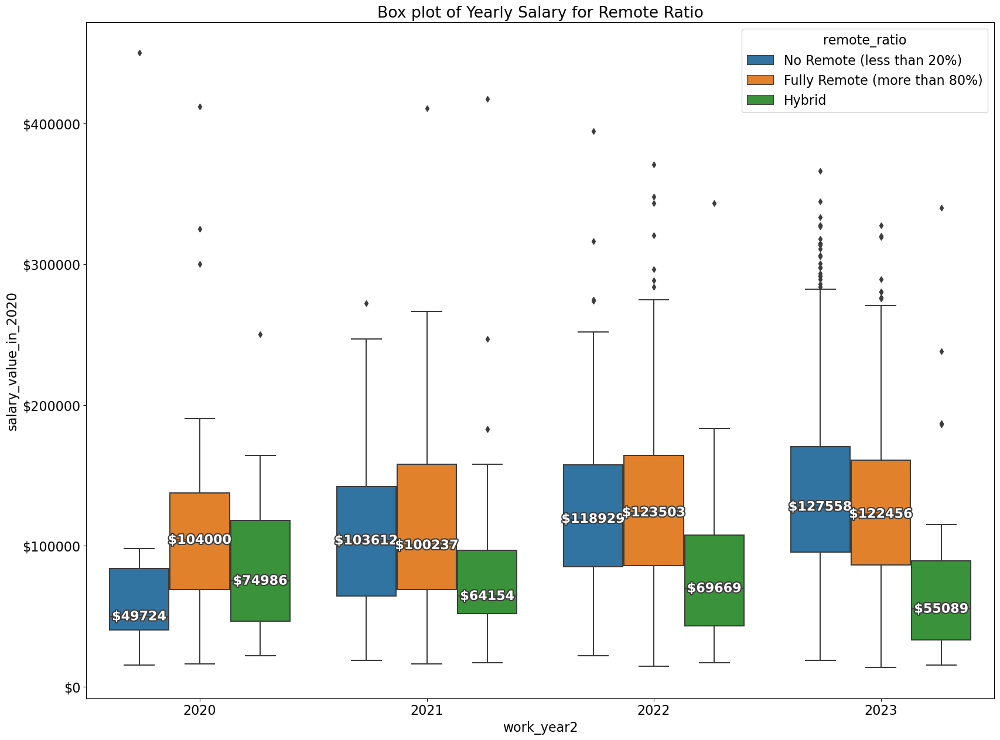

In [55]:
plt.rcParams.update({'font.size': 16})
plt.figure(figsize=(20,15))
plt.title('Box plot of Yearly Salary for Remote Ratio')
#date_form = DateFormatter("%y")
#plt.XAxis.set_major_formatter(date_form)
#plt.gca().yaxis.set_major_formatter(DateFormatter('%Y'))
#plt.set(ylabel='work_year2', xticklabels=year)
#sns.boxplot(data=us_dss, x='salary_value_in_2020',y='work_year2', hue='remote_ratio')
ax = sns.boxplot(data=dss5, y='salary_value_in_2020',x='work_year2', hue='remote_ratio',order=['2020','2021','2022','2023'])
# getting the array of values of y-axis
ticks = ax.get_yticks()
# formatted the values into strings beginning with dollar sign
new_labels = [f'${int(amt)}' for amt in ticks]
# Set the new labels
ax.set_yticklabels(new_labels)
add_median_labels(ax)
#medians = dss5.groupby(['work_year2'])['salary_value_in_2020'].median()
#vertical_offset = dss5['salary_value_in_2020'].median() * 0.05 # offset from median for display

#for xtick in ax.get_xticks():
#    ax.text(xtick,medians[xtick] + vertical_offset,medians[xtick], 
#            horizontalalignment='center',size='x-small',color='w',weight='semibold')

C:\Users\Stephen Lucas\AppData\Local\Temp\ipykernel_8816\1678769427.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(new_labels1)
C:\Users\Stephen Lucas\AppData\Local\Temp\ipykernel_8816\1678769427.py:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels(new_labels2)


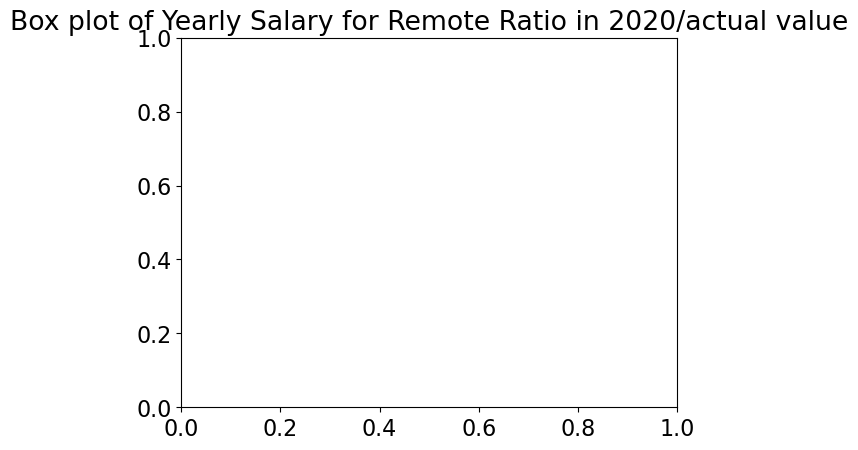

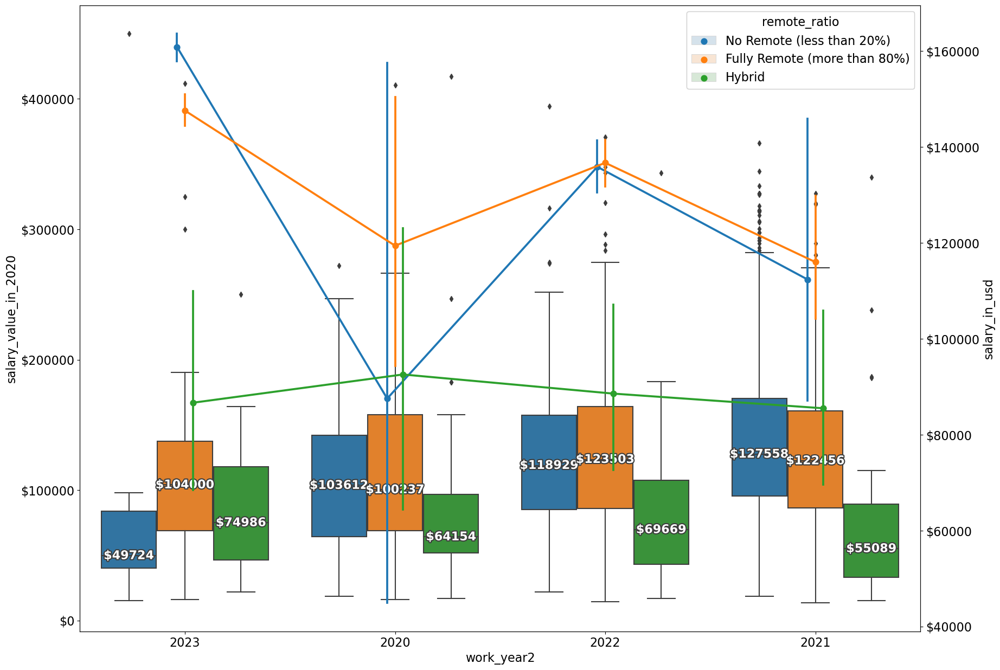

<Figure size 2000x1500 with 0 Axes>

In [52]:
#true_salary_medians = dss5.groupby(['work_year2','remote_ratio'])['salary_in_usd'].median().astype(int).reset_index()
#print(true_salary_medians)

plt.title('Box plot of Yearly Salary for Remote Ratio in 2020/actual value')
fig, ax1 = plt.subplots() # initializes figure and plots
ax2 = ax1.twinx() # applies twinx to ax2, which is the second y axis.

ax = sns.boxplot(data=dss5, x='work_year2', y='salary_value_in_2020', ax = ax1, hue='remote_ratio',order=['2020','2021','2022','2023'])
ax2 = sns.pointplot(data=dss5, x='work_year2', y='salary_in_usd', ax = ax2, hue='remote_ratio',dodge=True)
#ax2 = sns.pointplot(data=dss5, x='work_year2', y='salary_in_usd',hue='remote_ratio',dodge=True)
#ax2 = sns.lineplot(data=true_salary_medians, y='salary_in_usd',x='work_year2', hue='remote_ratio')
#ax = sns.boxplot(data=dss5, y='salary_in_usd',x='work_year2', hue='remote_ratio',order=['2020','2021','2022','2023'])
# getting the array of values of y-axis
plt.figure(figsize=(20,15))
ticks1 = ax1.get_yticks()
ticks2 = ax2.get_yticks()
# formatted the values into strings beginning with dollar sign
new_labels1 = [f'${int(amt)}' for amt in ticks1]
new_labels2 = [f'${int(amt)}' for amt in ticks2]
# Set the new labels
ax1.set_yticklabels(new_labels1)
ax2.set_yticklabels(new_labels2)
add_median_labels(ax1)
fig.set_figwidth(20)
fig.set_figheight(15)
#fig.set_title('Box plot of Yearly Salary for Remote Ratio in 2020/actual value')
#plt.show(); # shows the plot

C:\Users\Stephen Lucas\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<Axes: title={'center': 'Box plot of Yearly salary for remote ratio'}, xlabel='work_year', ylabel='salary_value_in_2020'>

C:\Users\Stephen Lucas\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 15.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


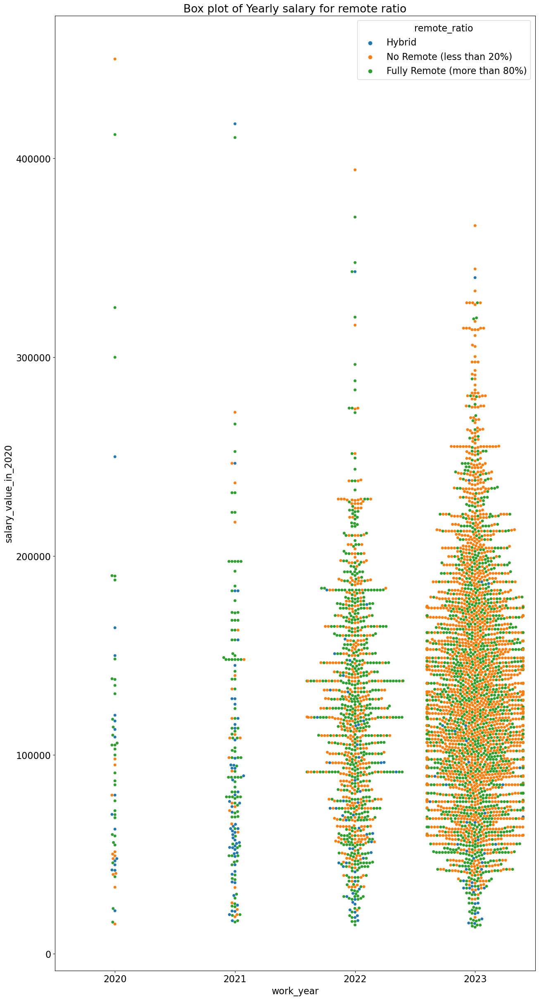

In [57]:
plt.figure(figsize=(15,30))
plt.rcParams.update({'font.size': 16})
plt.title('Box plot of Yearly salary for remote ratio')
sns.swarmplot(data=dss5, y='salary_value_in_2020',x='work_year',hue='remote_ratio')

In [51]:
pip install pandasql

Note: you may need to restart the kernel to use updated packages.


In [52]:
jtitles = sqldf('''select s.* from dss5 s
               where s.job_title like '%analyst'
or s.job_title like '%BI Data%'
or s.job_title like '%Busines%'
or s.job_title like '%Specialist'
or s.job_title like '%visua%'
or s.job_title like '%Analytics%'
order by s.job_title
                 ''')


jtitles

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,salary_value_in_2020,work_year2
0,2023,Mid,FT,Analytics Engineer,172200,USD,172200,US,Fully Remote (more than 80%),US,M,146436.41,2023
1,2023,Mid,FT,Analytics Engineer,131200,USD,131200,US,Fully Remote (more than 80%),US,M,111570.60,2023
2,2023,Senior,FT,Analytics Engineer,160000,USD,160000,US,No Remote (less than 20%),US,M,136061.70,2023
3,2023,Senior,FT,Analytics Engineer,136000,USD,136000,US,No Remote (less than 20%),US,M,115652.45,2023
4,2023,Mid,FT,Analytics Engineer,300000,GBP,369120,GB,No Remote (less than 20%),GB,M,313894.35,2023
5,2023,Mid,FT,Analytics Engineer,60000,GBP,73824,GB,No Remote (less than 20%),GB,M,62778.87,2023
6,2023,Senior,FT,Analytics Engineer,162000,USD,162000,US,No Remote (less than 20%),US,M,137762.47,2023
7,2023,Senior,FT,Analytics Engineer,130000,USD,130000,US,No Remote (less than 20%),US,M,110550.13,2023
8,2023,Senior,FT,Analytics Engineer,205218,USD,205218,US,No Remote (less than 20%),US,M,174514.44,2023
9,2023,Senior,FT,Analytics Engineer,136743,USD,136743,US,No Remote (less than 20%),US,M,116284.28,2023


In [53]:
jtitles2 = sqldf('''select s.work_year, s.job_title, s.remote_ratio, s.salary_value_in_2020, s.work_year2 from dss5 s
               ''')


jtitles2

,work_year,job_title,remote_ratio,salary_value_in_2020,work_year2
0,2023,Data Engineer,No Remote (less than 20%),215821.07,2023
1,2023,Data Engineer,No Remote (less than 20%),134888.17,2023
2,2023,Business Intelligence Specialist,No Remote (less than 20%),221015.23,2023
3,2023,Business Intelligence Specialist,No Remote (less than 20%),118373.68,2023
4,2023,Machine Learning Infrastructure Engineer,Fully Remote (more than 80%),100445.85,2023
5,2023,Machine Learning Infrastructure Engineer,Fully Remote (more than 80%),68010.44,2023
6,2023,Research Scientist,No Remote (less than 20%),249162.99,2023
7,2023,Research Scientist,No Remote (less than 20%),157321.34,2023
8,2023,Data Engineer,No Remote (less than 20%),153069.41,2023
9,2023,Data Engineer,No Remote (less than 20%),76534.71,2023


In [54]:
titlecount = pd.DataFrame(jtitles2.groupby(['job_title']).size().reset_index(name='count'))
titlecount

,job_title,count
0,AI Architect,4
1,AI Developer,9
2,AI Engineer,22
3,AI Programmer,5
4,AI Research Engineer,3
5,AI Scientist,14
6,AWS Data Architect,1
7,Analytics Engineer,182
8,Analytics Engineering Manager,1
9,Applied Data Scientist,8


In [55]:
titlecount.head(20)['job_title']

0                           AI Architect
1                           AI Developer
2                            AI Engineer
3                          AI Programmer
4                   AI Research Engineer
5                           AI Scientist
6                     AWS Data Architect
7                     Analytics Engineer
8          Analytics Engineering Manager
9                 Applied Data Scientist
10     Applied Machine Learning Engineer
11    Applied Machine Learning Scientist
12                     Applied Scientist
13         Autonomous Vehicle Technician
14                   Azure Data Engineer
15                            BI Analyst
16                       BI Data Analyst
17                      BI Data Engineer
18                          BI Developer
19                    Big Data Architect
Name: job_title, dtype: object

In [56]:
jtitles['job_title'].value_counts()

Data Analyst                          657
Analytics Engineer                    182
Business Intelligence Engineer         39
Business Intelligence Analyst          36
Data Specialist                        30
Data Analytics Manager                 27
Research Analyst                       27
BI Analyst                             17
BI Data Analyst                        15
Business Data Analyst                  15
Business Intelligence Developer        12
Data Quality Analyst                   12
Data Operations Analyst                10
Data Integration Specialist             6
Lead Data Analyst                       5
Data Analytics Engineer                 4
Business Intelligence Specialist        4
Product Data Analyst                    4
Insight Analyst                         4
Financial Data Analyst                  4
Data Visualization Specialist           4
Data Visualization Engineer             4
Data Operations Specialist              4
Data Analytics Lead               

In [57]:
jtitles2Red = jtitles2.loc[jtitles2['job_title'].isin(titlecount.head(20)['job_title'])]
jtitles2Red

,work_year,job_title,remote_ratio,salary_value_in_2020,work_year2
20,2023,Applied Scientist,No Remote (less than 20%),188955.69,2023
21,2023,Applied Scientist,No Remote (less than 20%),115652.45,2023
38,2023,BI Developer,No Remote (less than 20%),142439.59,2023
39,2023,BI Developer,No Remote (less than 20%),90566.07,2023
42,2023,Applied Scientist,No Remote (less than 20%),239553.63,2023
43,2023,Applied Scientist,No Remote (less than 20%),119989.41,2023
104,2023,Applied Scientist,Fully Remote (more than 80%),183683.30,2023
105,2023,Applied Scientist,Fully Remote (more than 80%),156470.96,2023
115,2023,Applied Scientist,Fully Remote (more than 80%),195588.70,2023
116,2023,Applied Scientist,Fully Remote (more than 80%),166675.58,2023


  work_year2                           job_title  work_year  \
0       2020                     BI Data Analyst       2020   
1       2021                        AI Scientist       2021   
2       2021              Applied Data Scientist       2021   
3       2021  Applied Machine Learning Scientist       2021   
4       2021                     BI Data Analyst       2021   

   salary_value_in_2020  
0                 98000  
1                 54272  
2                 81051  
3                227650  
4                 84186  


C:\Users\Stephen Lucas\AppData\Local\Temp\ipykernel_2612\2888270692.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  wageaverage_by_title_and_year = pd.DataFrame(jtitles2Red.groupby(['work_year2','job_title']).mean().astype(int).reset_index())


<Axes: title={'center': 'wageaverage_by_title_and_year'}, xlabel='work_year2', ylabel='salary_value_in_2020'>

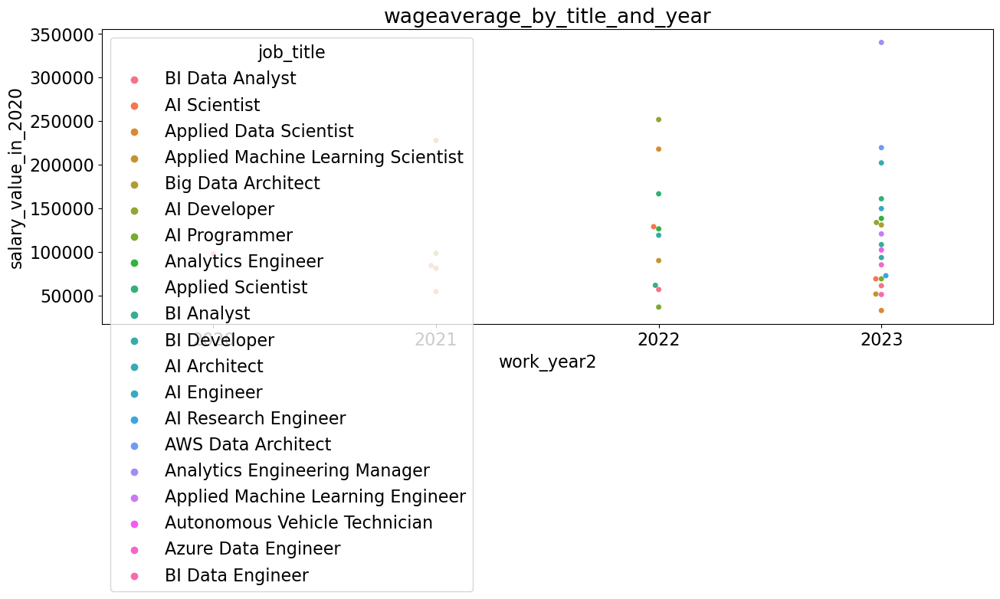

In [58]:
wageaverage_by_title_and_year = pd.DataFrame(jtitles2Red.groupby(['work_year2','job_title']).mean().astype(int).reset_index())
print(wageaverage_by_title_and_year.head())
plt.figure(figsize=(15,5))
plt.title('wageaverage_by_title_and_year')
sns.swarmplot(data=wageaverage_by_title_and_year, x='work_year2', y='salary_value_in_2020',hue='job_title')

<Axes: title={'center': 'wageaverage_by_title_and_year'}, xlabel='work_year2', ylabel='salary_value_in_2020'>

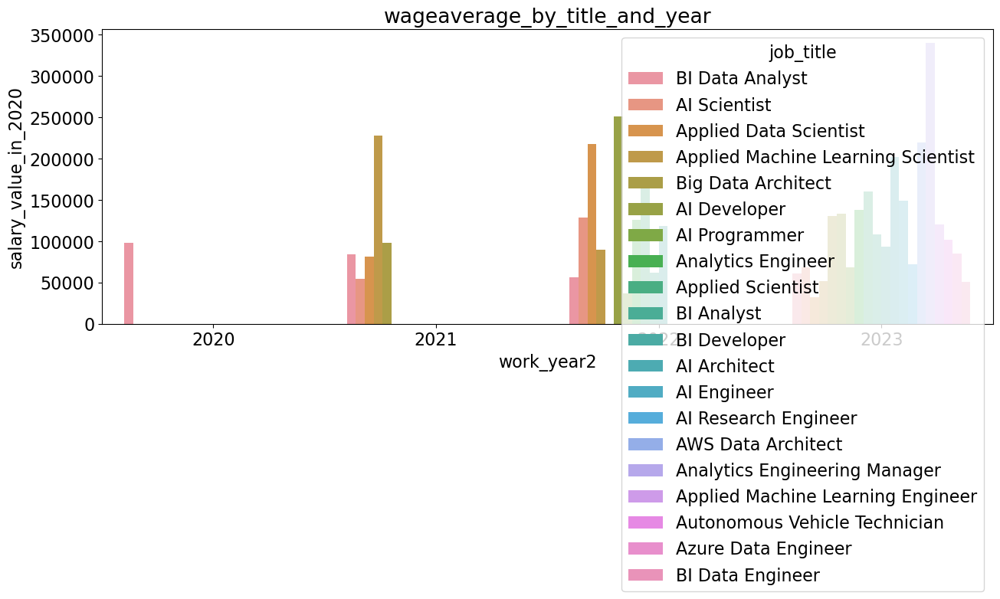

In [59]:
plt.figure(figsize=(15,5))
plt.title('wageaverage_by_title_and_year')
sns.barplot(data=wageaverage_by_title_and_year, x='work_year2', y='salary_value_in_2020', hue='job_title')